# Modulation Plans

In [1]:
%load_ext autoreload
%autoreload 2

from typing import Literal
import re
import ms3
import pandas as pd
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 500)

from create_gantt import create_modulation_plan, get_phraseends

In [2]:
CORPUS_PATH = "~/all_subcorpora/couperin_concerts"

In [3]:
corpus_obj = ms3.Corpus(CORPUS_PATH)
corpus_obj.view.include('facet', 'expanded')
corpus_obj.parse_tsv()
corpus_obj

[default|all]
Corpus 'couperin_concerts'
--------------------------
Location: C:\Users\hentsche/all_subcorpora/couperin_concerts
View: This view is called 'default'. It 
	- excludes pieces that are not contained in the metadata,
	- filters out file extensions requiring conversion (such as .xml),
	- excludes review files and folders, and
	- includes only facets containing 'expanded'.

All 84 pieces are listed in 'metadata.tsv':

                             expanded       
                             detected parsed
c01n01_prelude                      1      1
c01n02_allemande                    1      1
c01n03_sarabande                    1      1
c01n04_gavotte                      1      1
c01n05_gigue                        1      1
c01n06_menuet_en_trio               1      1
c02n01_prelude                      1      1
c02n02_allemande_fuguee             1      1
c02n03_air_tendre                   1      1
c02n04_air_contrefugue              1      1
c02n05_echos                

In [4]:
md = corpus_obj.metadata()
md.head()

,TimeSig,KeySig,last_mc,last_mn,length_qb,last_mc_unfolded,last_mn_unfolded,length_qb_unfolded,volta_mcs,all_notes_qb,n_onsets,n_onset_positions,guitar_chord_count,form_label_count,label_count,annotated_key,harmony_version,annotators,reviewers,composed_start,composed_end,composer,workTitle,movementNumber,movementTitle,workNumber,poet,lyricist,arranger,copyright,creationDate,mscVersion,platform,source,translator,title_text,subtitle_text,lyricist_text,composer_text,musescore,ms3_version,subdirectory,rel_path,has_drumset,ambitus,path,extension,annotator,reviewer,originalFormat,staff_1_instrument,staff_1_ambitus,staff_2_instrument,staff_2_ambitus,staff_3_instrument,staff_3_ambitus
piece,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
c01n01_prelude,1: 4/4,1: 1,25,23,98.0,25,23,98.0,,219.00,386,251,0,0,93,G,2.1.0,Eva-Maria Hamberger,Johannes Menke,1722,1722,François Couperin,NaN,,Concert Royal no 1: Prélude,NaN,NaN,NaN,NaN,"© Les Éditions Outremontaises, 2006",2019-10-09,3.02,Linux,NaN,NaN,"<font size=""13.5""/><font face=""SnellRoundhand ...","<font size=""18""/><font face=""SnellRoundhand Bo...",NaN,"<font size=""18""/><font face=""SnellRoundhand Bo...",3.6.2,1.2.7,MS3,MS3/c01n01_prelude.mscx,False,36-84 (C2-C6),MS3/c01n01_prelude.mscx,.mscx,Eva-Maria Hamberger,Johannes Menke,xml,Instrument 1,59-84 (B3-C6),Instrument 1,36-57 (C2-A3),NaN,NaN
c01n02_allemande,1: 4/4,1: 1,20,18,72.0,40,36,144.0,,168.50,346,207,0,0,76,G,2.1.0,Eva-Maria Hamberger,Johannes Menke,1722,1722,François Couperin,NaN,,Concert Royal no 1: Allemande,NaN,NaN,NaN,NaN,"© Les Éditions Outremontaises, 2006",2019-10-09,3.02,Linux,NaN,NaN,"<font size=""13.5""/><font face=""SnellRoundhand ...","<font size=""27""/><font face=""SnellRoundhand Bo...","<font size=""12""/>2","<font size=""18""/><font face=""SnellRoundhand Bo...",3.6.2,1.2.7,MS3,MS3/c01n02_allemande.mscx,False,31-83 (G1-B5),MS3/c01n02_allemande.mscx,.mscx,Eva-Maria Hamberger,Johannes Menke,xml,Instrument 1,59-83 (B3-B5),Instrument 1,31-66 (G1-F#4),NaN,NaN
c01n03_sarabande,1: 3/4,1: -2,30,28,90.0,56,56,168.0,"[[[8], [9]], [[29], [30]]]",237.75,291,159,0,0,67,g,2.1.0,Eva-Maria Hamberger,Johannes Menke,1722,1722,François Couperin,NaN,,Concert Royal no 1: Sarabande,NaN,NaN,NaN,NaN,"© Les Éditions Outremontaises, 2006",2019-10-09,3.02,Linux,NaN,NaN,"<font size=""13.5""/><font face=""SnellRoundhand ...","<font size=""27""/><font face=""SnellRoundhand Bo...",NaN,"<font size=""12""/>3; <font size=""18""/><font fac...",3.6.2,1.2.7,MS3,MS3/c01n03_sarabande.mscx,False,31-81 (G1-A5),MS3/c01n03_sarabande.mscx,.mscx,Eva-Maria Hamberger,Johannes Menke,xml,Instrument 1,58-81 (Bb3-A5),Instrument 1,31-67 (G1-G4),NaN,NaN
c01n04_gavotte,1: 2/2,1: -2,18,14,60.0,32,28,112.0,"[[[5], [6]], [[17], [18]]]",135.00,195,113,0,0,52,g,2.1.0,Eva-Maria Hamberger,Johannes Menke,1722,1722,François Couperin,NaN,,Concert Royal no 1: Gavotte,NaN,NaN,NaN,NaN,"© Les Éditions Outremontaises, 2006",2019-10-09,3.02,Linux,NaN,NaN,"<font size=""13.5""/><font face=""SnellRoundhand ...","<font size=""27""/><font face=""SnellRoundhand Bo...","<font size=""12""/>4","<font size=""18""/><font face=""SnellRoundhand Bo...",3.6.2,1.2.7,MS3,MS3/c01n04_gavotte.mscx,False,38-79 (D2-G5),MS3/c01n04_gavotte.mscx,.mscx,Eva-Maria Hamberger,Johannes Menke,xml,Instrument 1,58-79 (Bb3-G5),Instrument 1,38-57 (D2-A3),NaN,NaN
c01n05_gigue,1: 6/8,1: 1,33,30,93.5,62,60,180.0,"[[[11], [12]], [[32], [33]]]",194.00,389,215,0,0,134,G,2.1.0,Eva-Maria Hamberger,Johannes Menke,1722,1722,François Couperin,NaN,,Concert Royal no 1: Gigue,NaN,NaN,NaN,NaN,"© Les Éditions Outremontaises, 2006",2019-10-09,3.02,Linux,NaN,NaN,"<font size=""13.5""/><font face=""SnellRoundhand ...","<font size=""18""/><font face=""SnellRoundhand Bo...","<font size=""12""/>6","<font size=""18""/><font face=""SnellRoundhand Bo...",3.6.2,1.2.7,MS3,MS3/c01n05_gigue.mscx,False,38-83 (D2-B5),MS3/c01n05_gigue.mscx,.mscx,Eva-Maria Hamberger,Johannes Menke,xml,Instrument 1,59-83 (B3-B5),Instrument 1,38-64 (D2-E4

In [5]:
def make_modulation_plans(
    corpus_obj: ms3.Corpus,
    yaxis: Literal['semitones', 'fifths', 'numeral'] = 'semitones',
    regex = None
):
    for fname, piece in corpus_obj.iter_pieces():
        if regex is not None and not re.search(regex, fname):
            continue
        print(f"Creating modulation plan for {fname}...")
        at = piece.expanded()
        at = at[at.quarterbeats.notna() & (at.quarterbeats != "")]
        metadata = md.loc[fname]
        last_mn = metadata.last_mn
        try:
            globalkey = metadata.annotated_key
        except Exception:
            print('Global key is missing in the metadata.')
            globalkey = '?'
        data = ms3.make_gantt_data(at)
        if len(data) == 0:
            print(f"Could not create Gantt data for {fname}...")
            continue
        phrases = get_phraseends(at, "quarterbeats")
        data.sort_values(yaxis, ascending=False, inplace=True)
        fig = create_modulation_plan(data, title=f"{fname}", globalkey=globalkey, task_column=yaxis, phraseends=phrases)
        fig.show()

## c01

Creating modulation plan for c01n01_prelude...


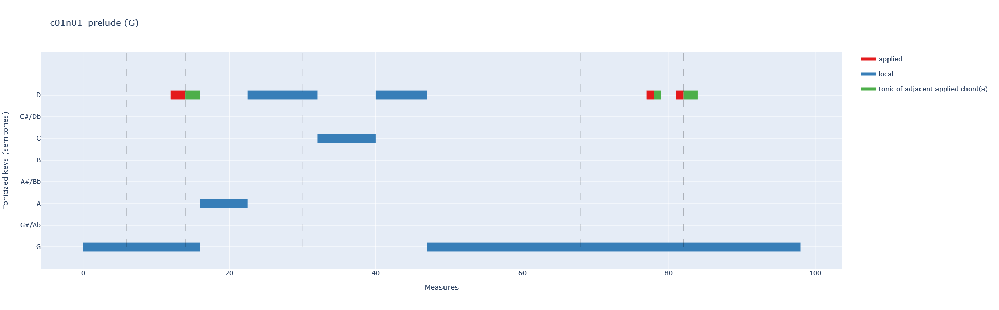

Creating modulation plan for c01n02_allemande...


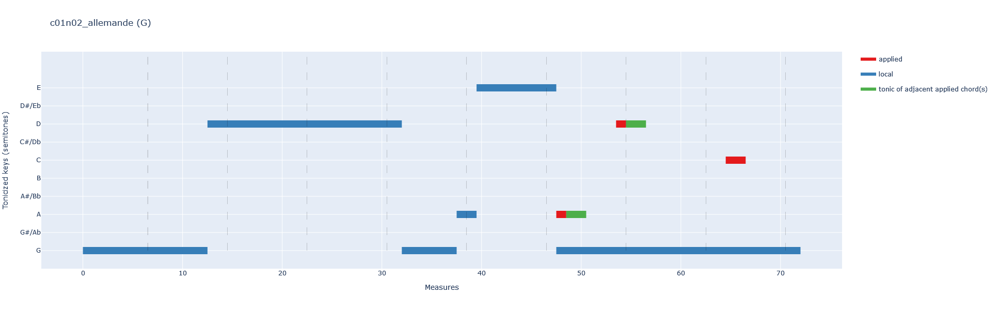

Creating modulation plan for c01n03_sarabande...


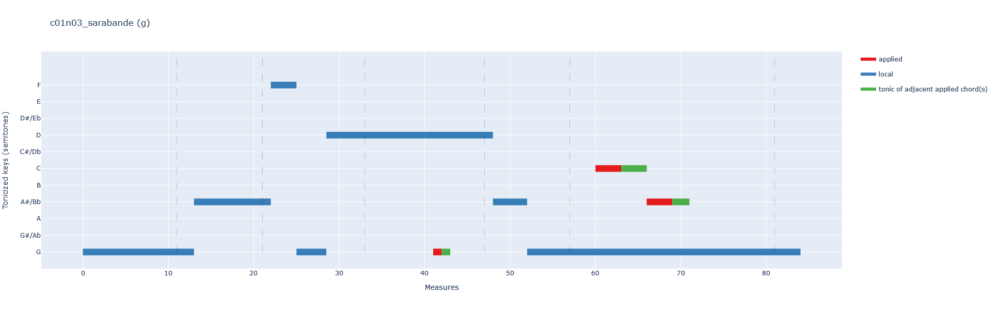

Creating modulation plan for c01n04_gavotte...


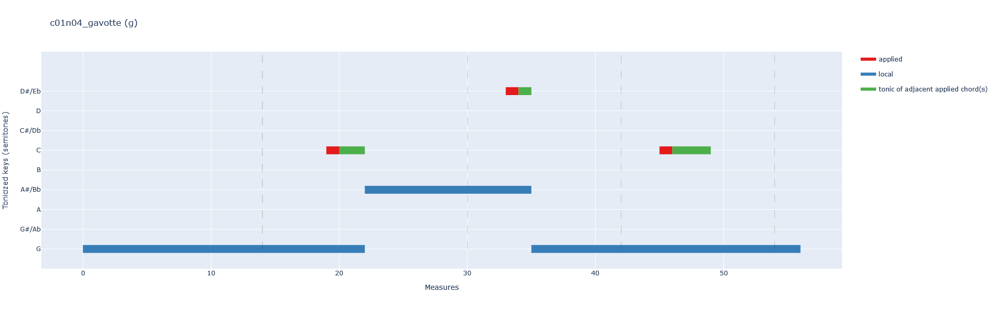

Creating modulation plan for c01n05_gigue...


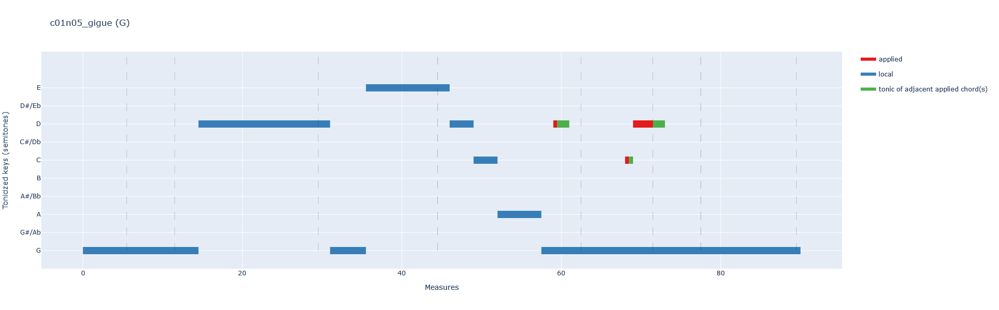

Creating modulation plan for c01n06_menuet_en_trio...


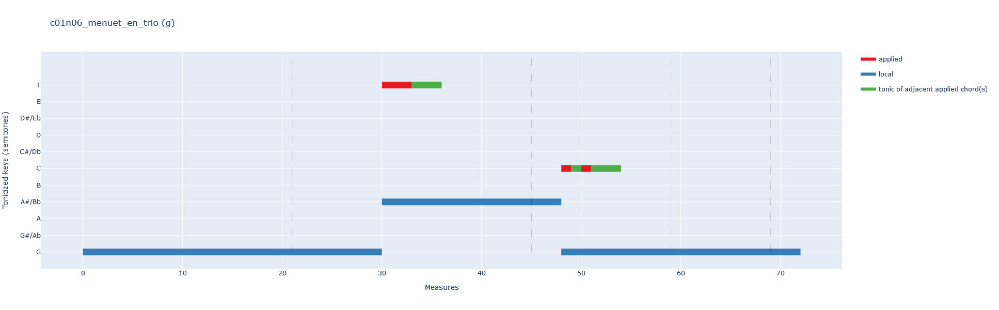

In [6]:
make_modulation_plans(corpus_obj, regex='c01')

## c02

Creating modulation plan for c02n01_prelude...


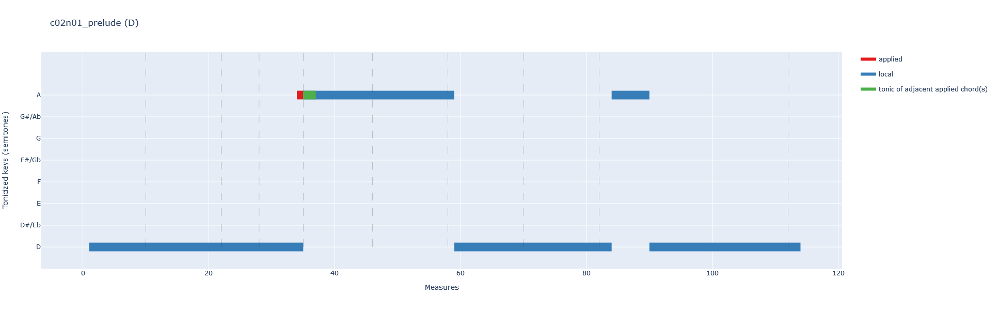

Creating modulation plan for c02n02_allemande_fuguee...


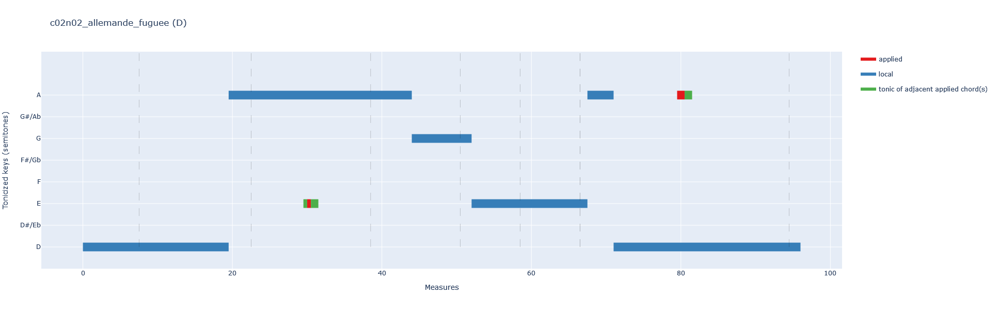

Creating modulation plan for c02n03_air_tendre...


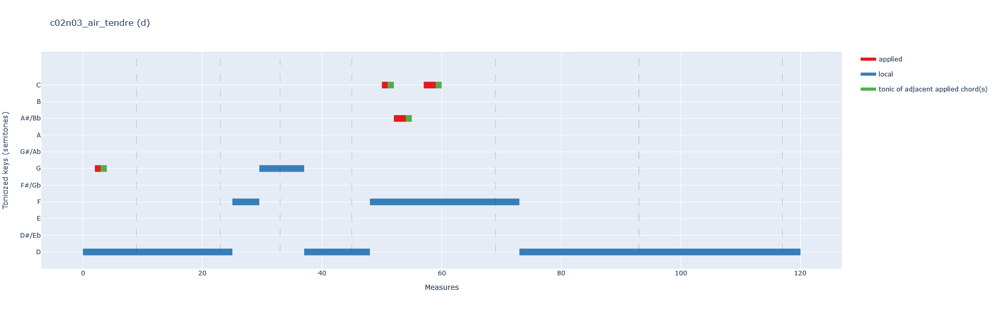

Creating modulation plan for c02n04_air_contrefugue...


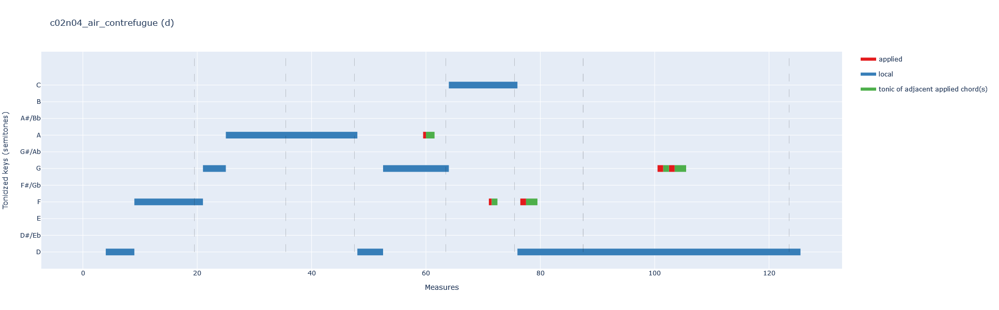

Creating modulation plan for c02n05_echos...


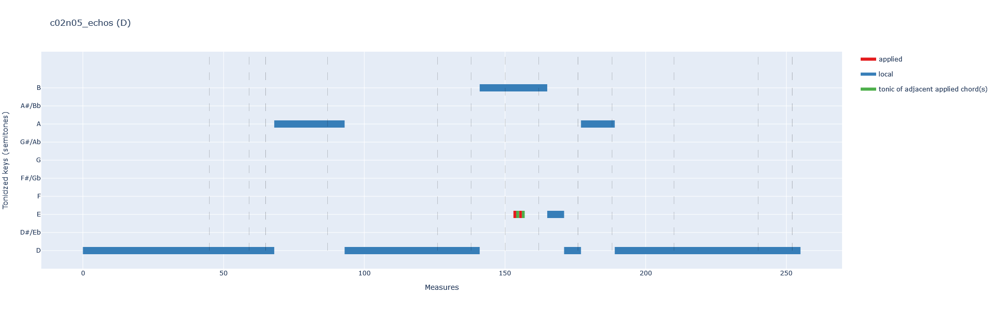

In [7]:
make_modulation_plans(corpus_obj, regex='c02')

## c03

Creating modulation plan for c03n01_prelude...


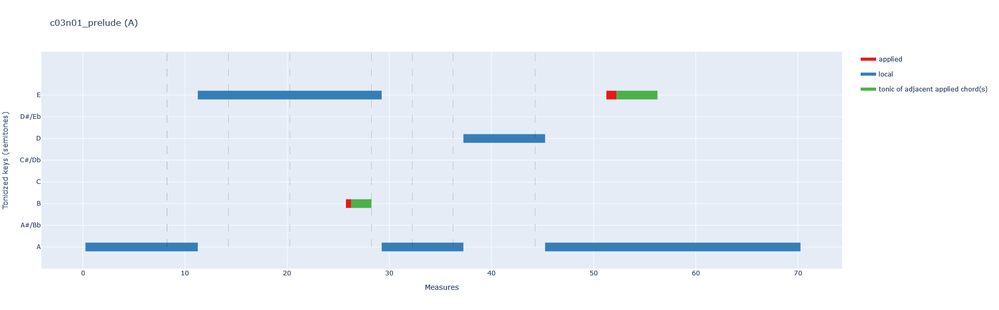

Creating modulation plan for c03n02_allemande...


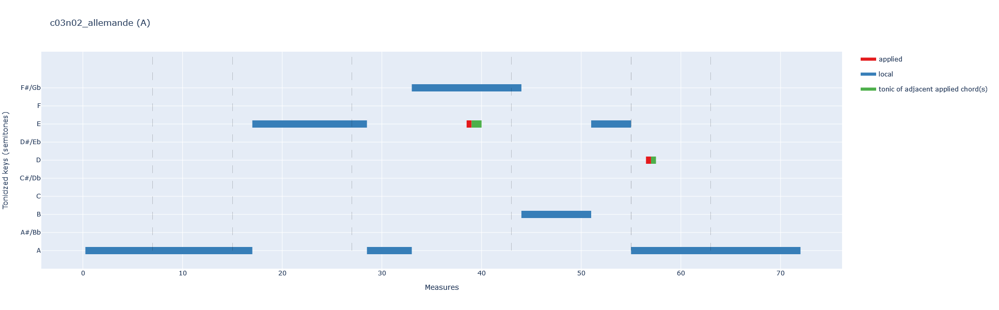

Creating modulation plan for c03n03_courante...


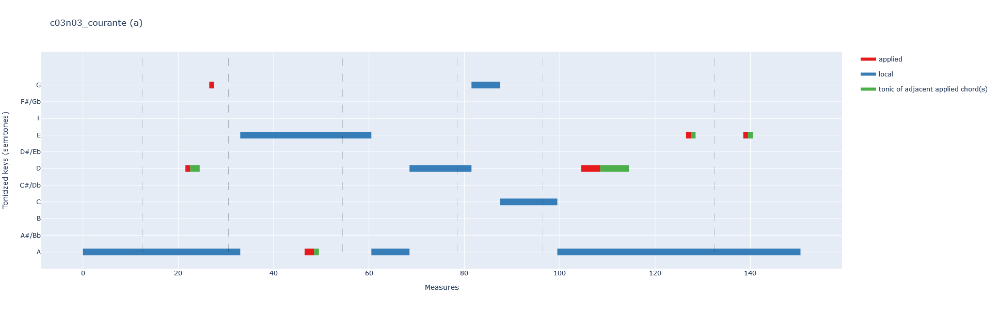

Creating modulation plan for c03n04_sarabande_grave...


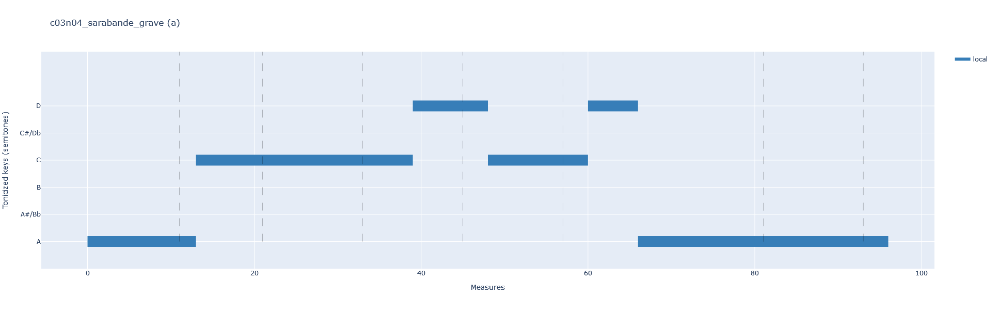

Creating modulation plan for c03n05_gavotte...


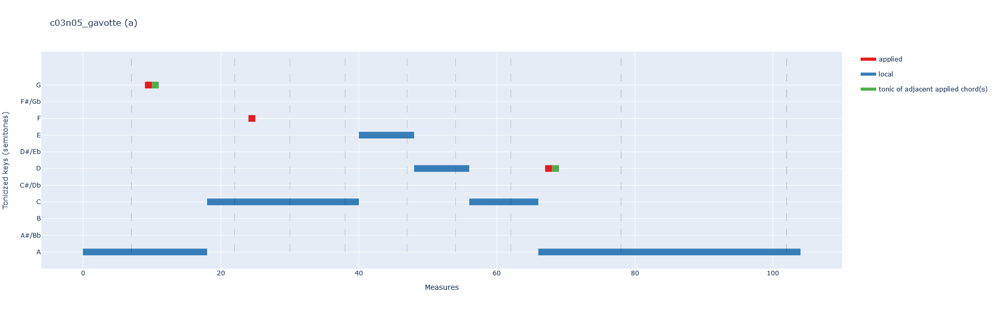

Creating modulation plan for c03n06_musette_1...


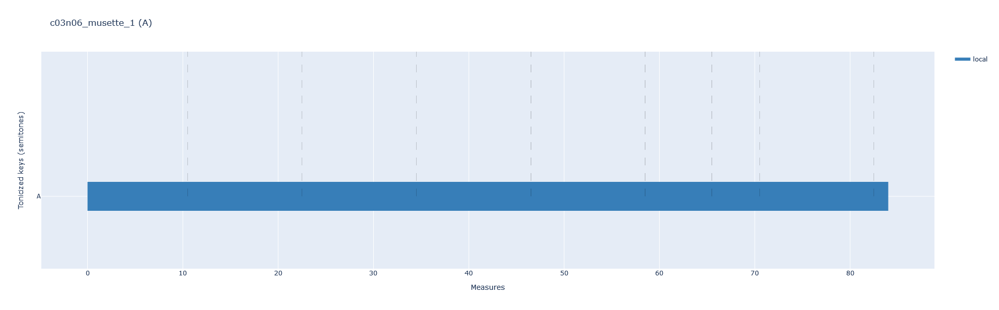

Creating modulation plan for c03n07_musette_2...


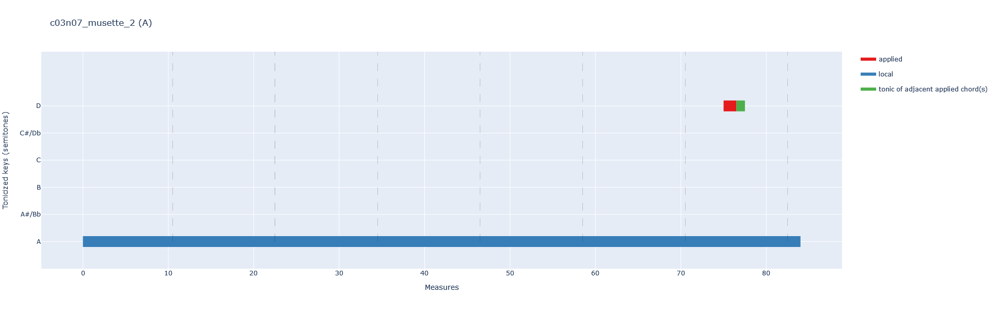

Creating modulation plan for c03n08_chaconne_legere...


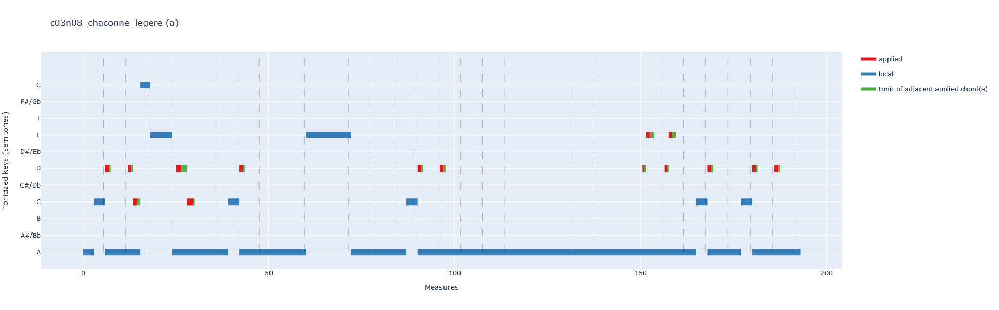

In [8]:
make_modulation_plans(corpus_obj, regex='c03')

## c04

Creating modulation plan for c04n01_prelude...


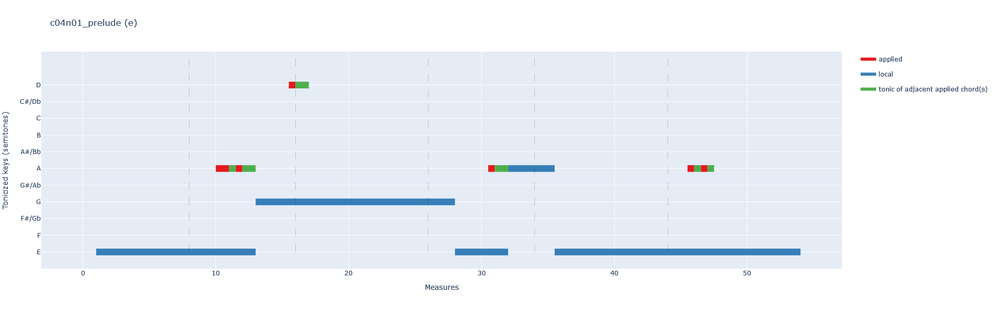

Creating modulation plan for c04n02_allemande...


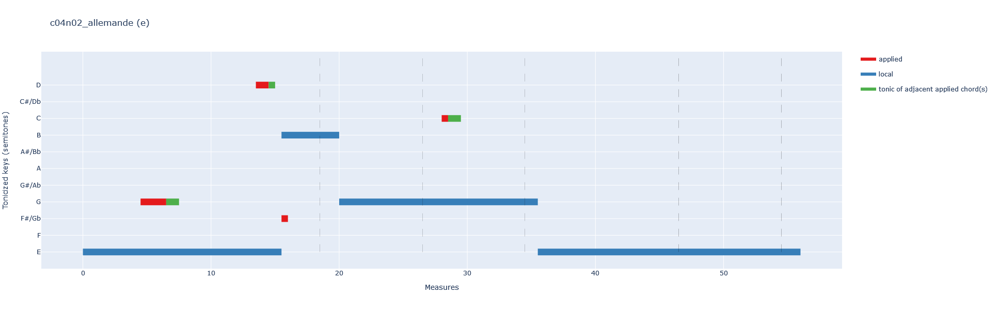

Creating modulation plan for c04n03_courante_francoise...


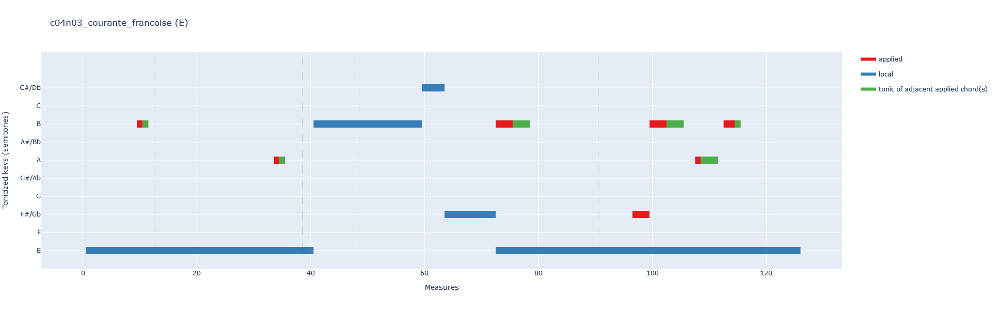

Creating modulation plan for c04n04_courante_a_litalienne...


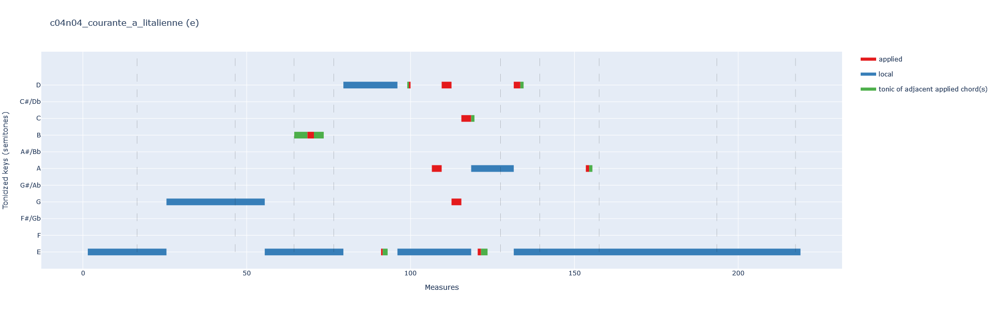

Creating modulation plan for c04n05_sarabande...


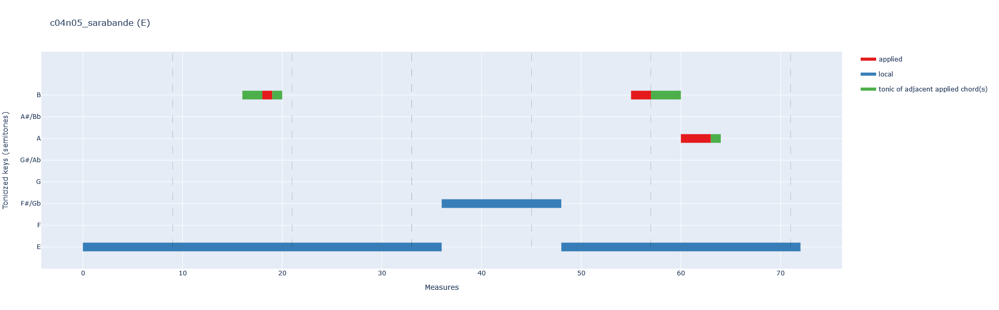

Creating modulation plan for c04n06_rigaudon...


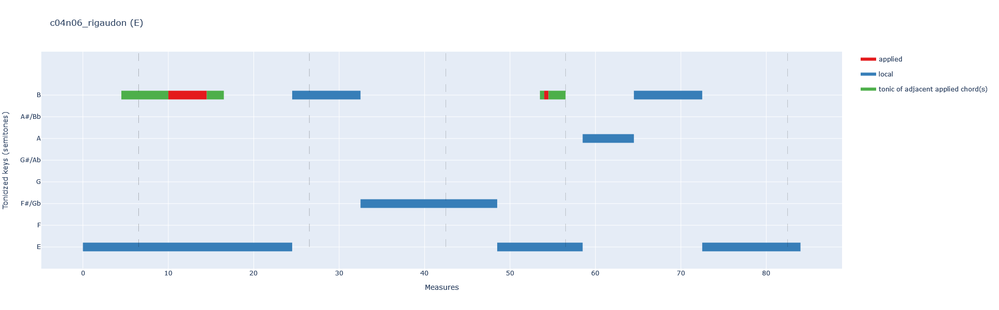

Creating modulation plan for c04n07_forlane...


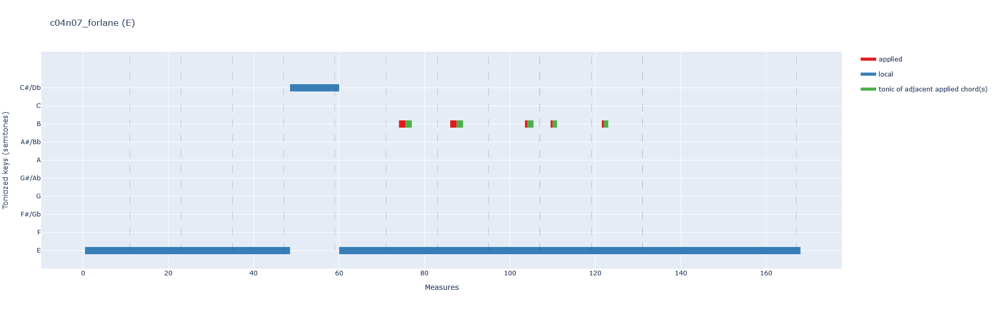

In [9]:
make_modulation_plans(corpus_obj, regex='c04')

## c05

Creating modulation plan for c05n01_prelude...


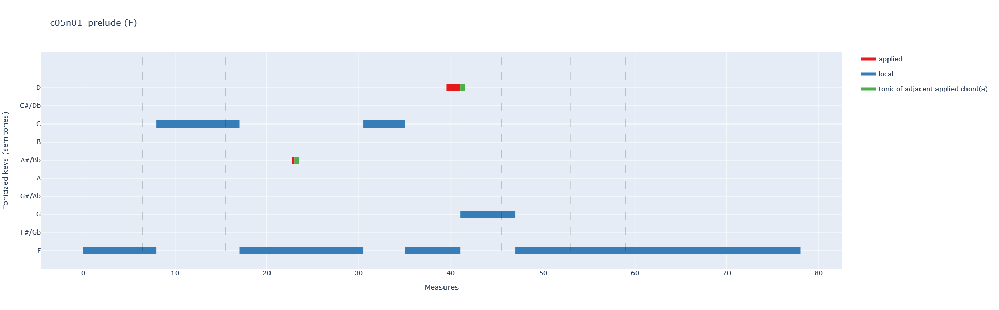

Creating modulation plan for c05n02_allemande...


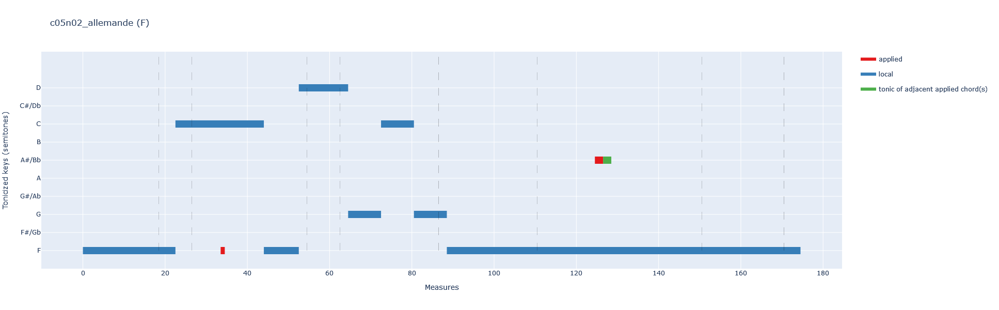

Creating modulation plan for c05n03_sarabande...


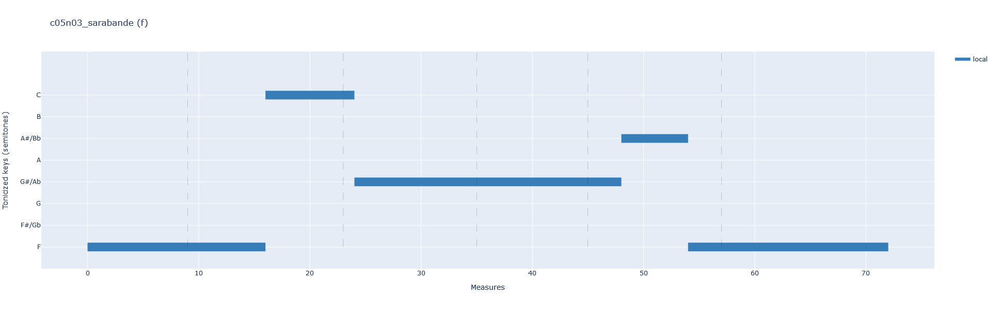

Creating modulation plan for c05n04_gavote...


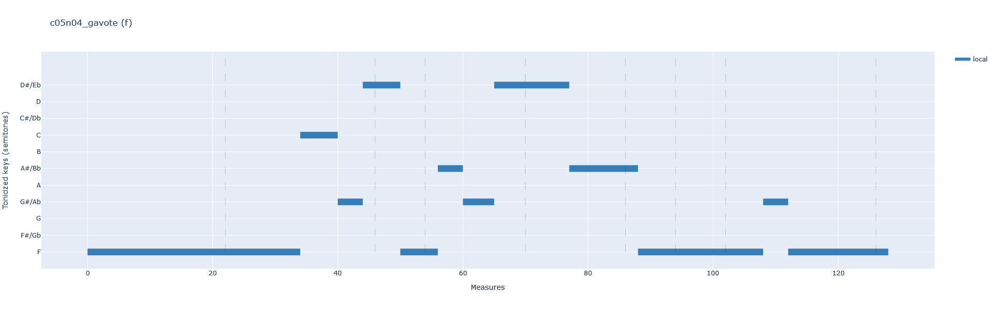

Creating modulation plan for c05n05_musete...


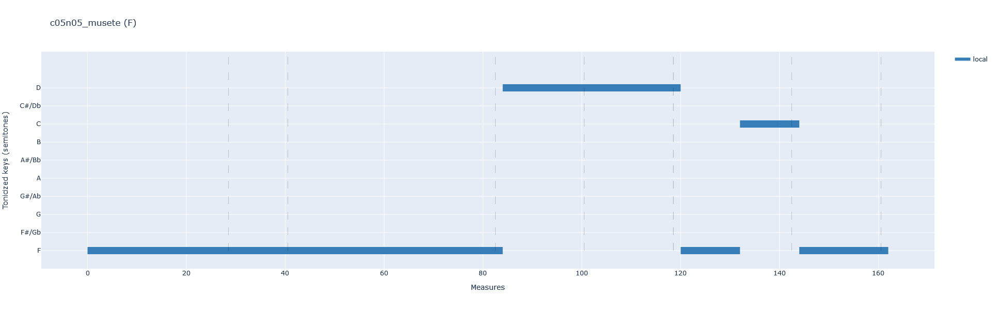

In [10]:
make_modulation_plans(corpus_obj, regex='c05')

## c06

Creating modulation plan for c06n01_grave...


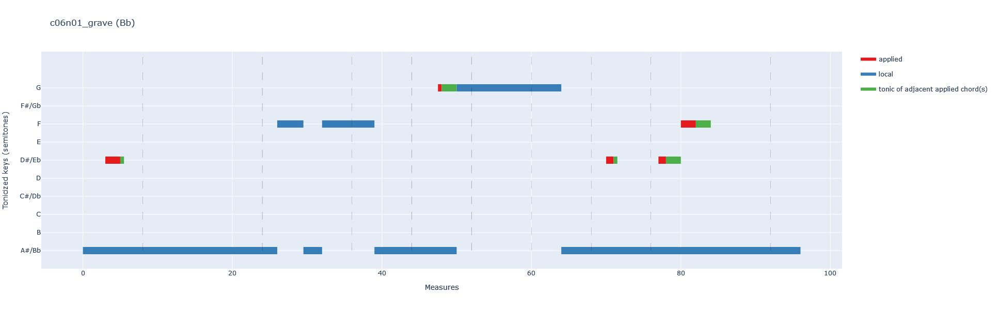

Creating modulation plan for c06n02_allemande...


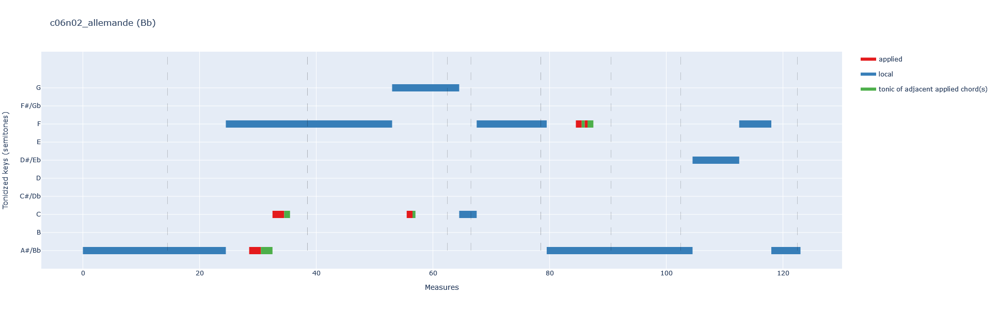

Creating modulation plan for c06n03_sarabande...


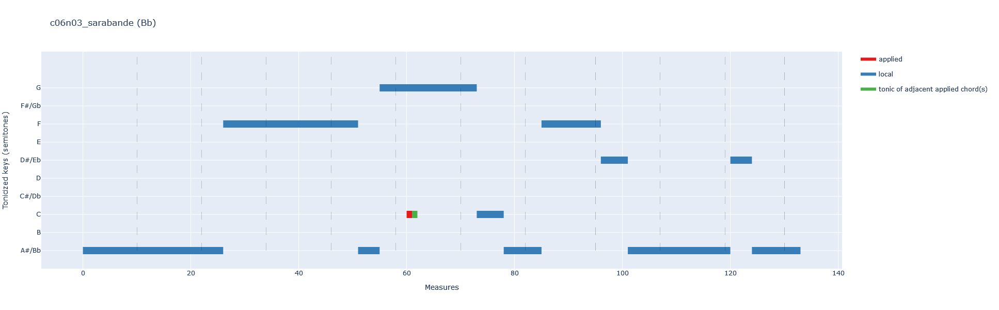

Creating modulation plan for c06n04_air_diable...


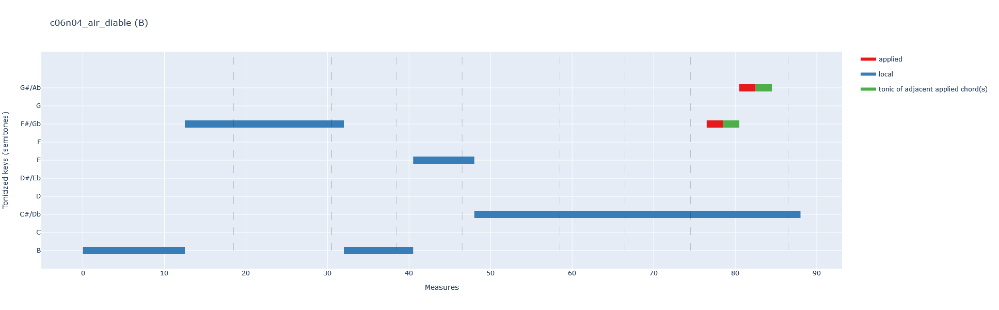

Creating modulation plan for c06n05_siciliene...


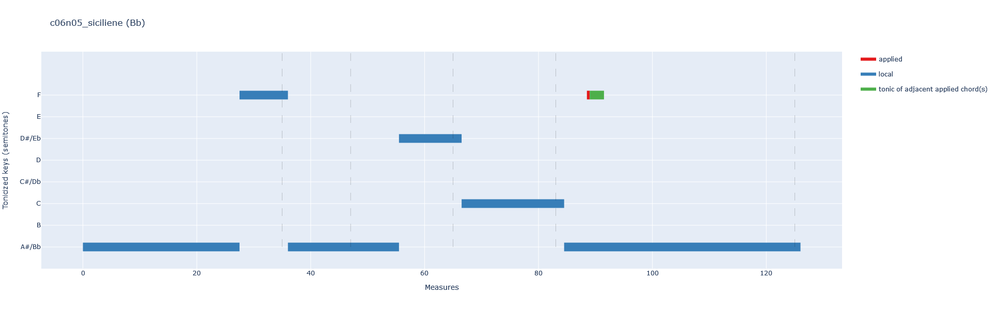

In [11]:
make_modulation_plans(corpus_obj, regex='c06')

## c07

Creating modulation plan for c07n01_grave...


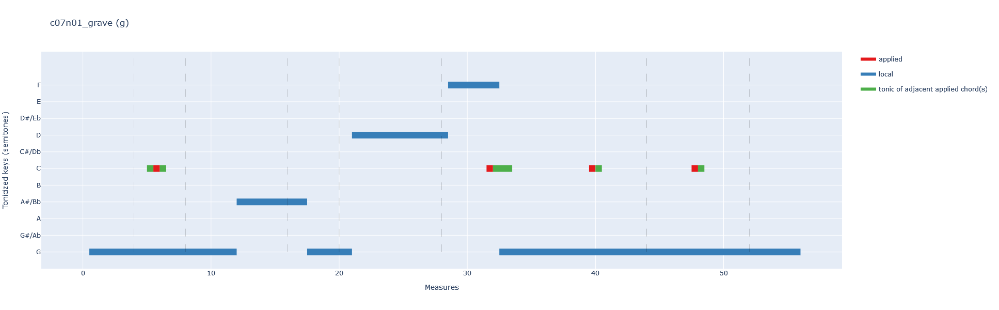

Creating modulation plan for c07n02_allemande...


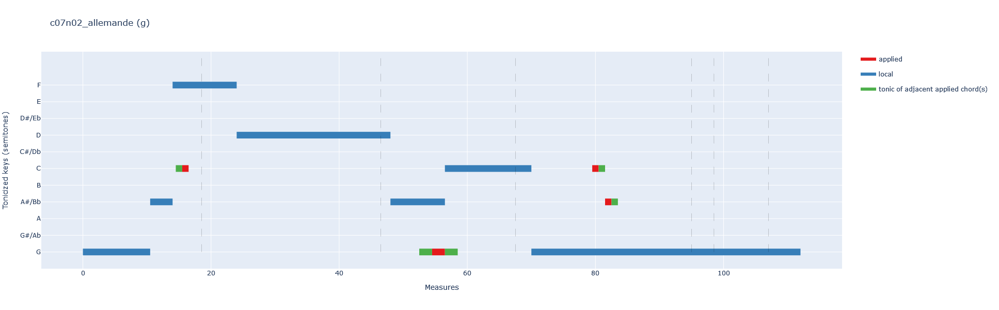

Creating modulation plan for c07n03_sarabande...


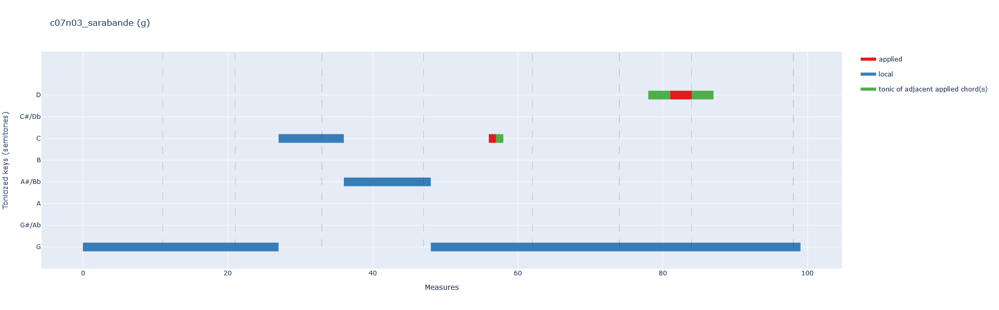

Creating modulation plan for c07n04_fuguete...


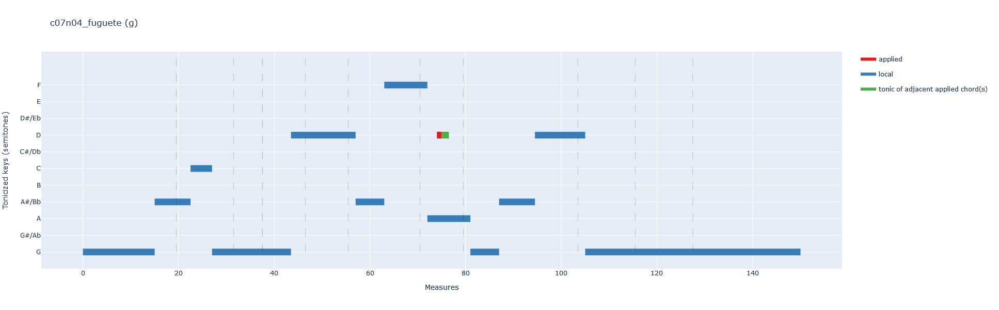

Creating modulation plan for c07n05_gavote...


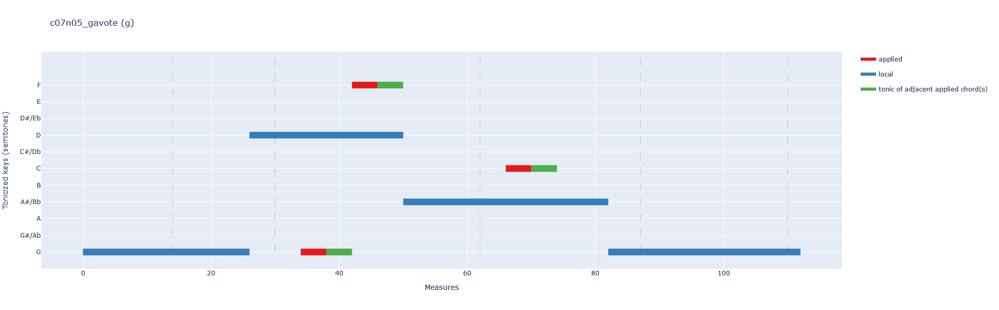

Creating modulation plan for c07n06_siciliene...


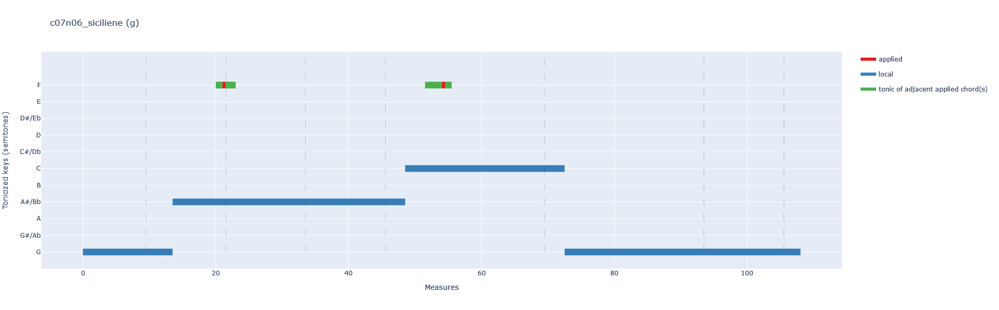

In [12]:
make_modulation_plans(corpus_obj, regex='c07')

## c08

Creating modulation plan for c08n01_ouverture...


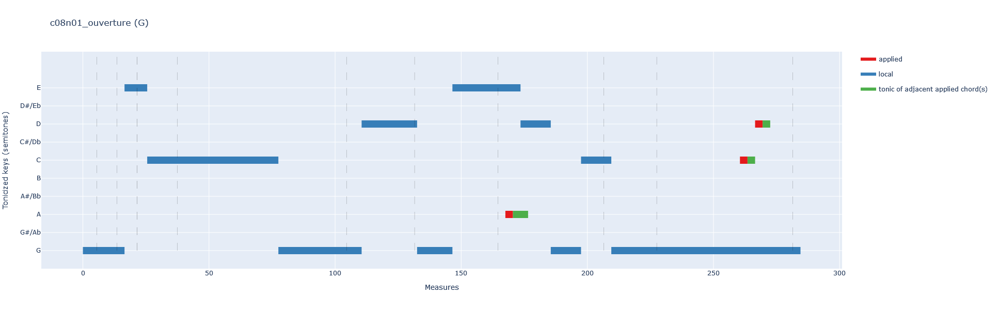

Creating modulation plan for c08n02_ritournele...


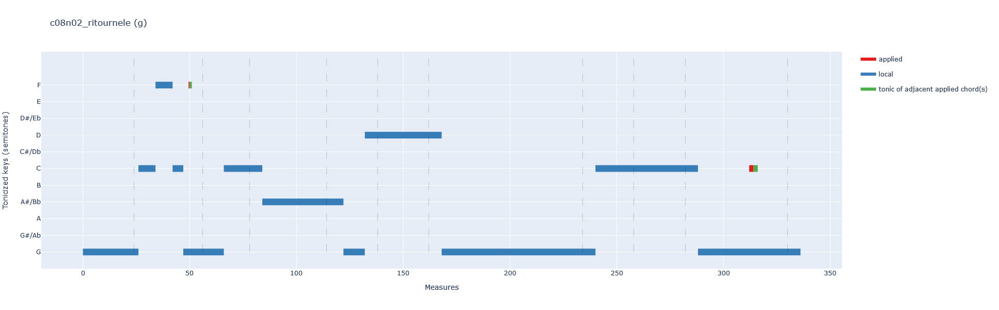

Creating modulation plan for c08n03_air...


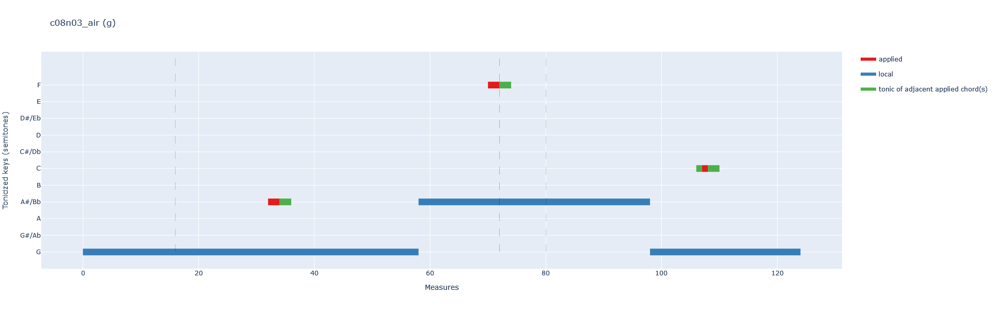

Creating modulation plan for c08n04_air_tendre...


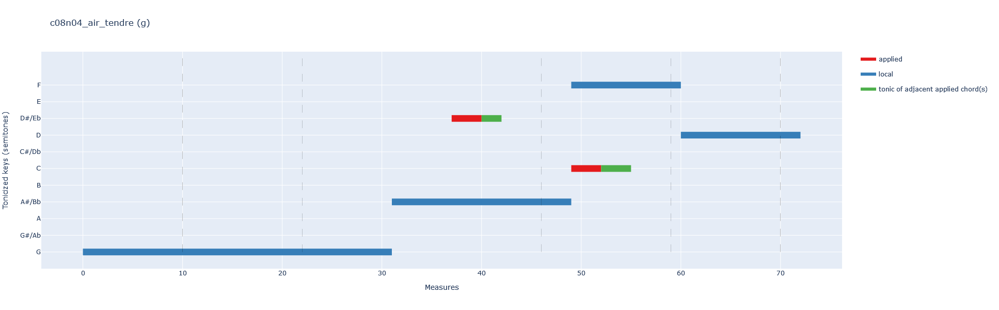

Creating modulation plan for c08n05_air_leger...


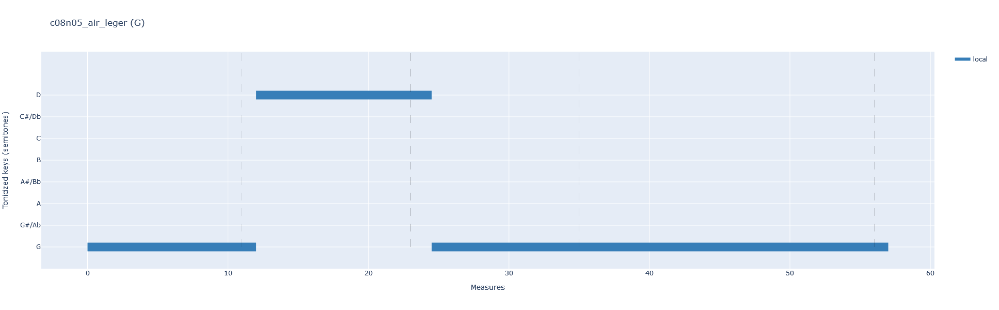

Creating modulation plan for c08n06_Loure...


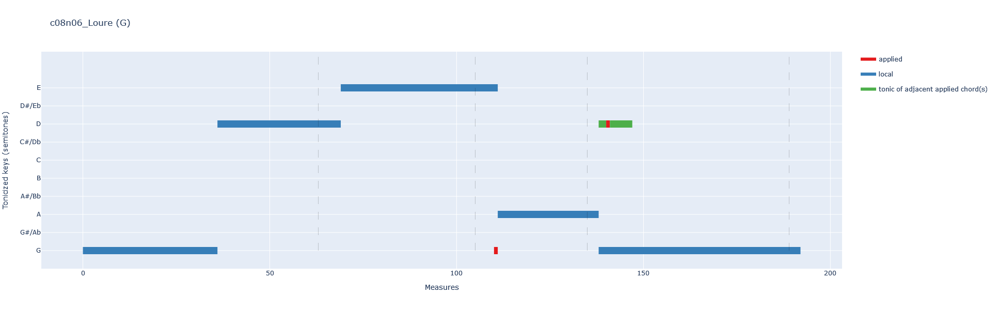

Creating modulation plan for c08n07_air...


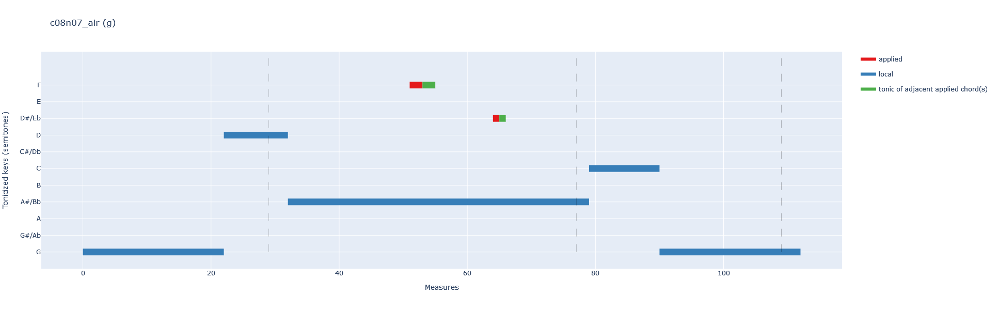

Creating modulation plan for c08n08_sarabande...


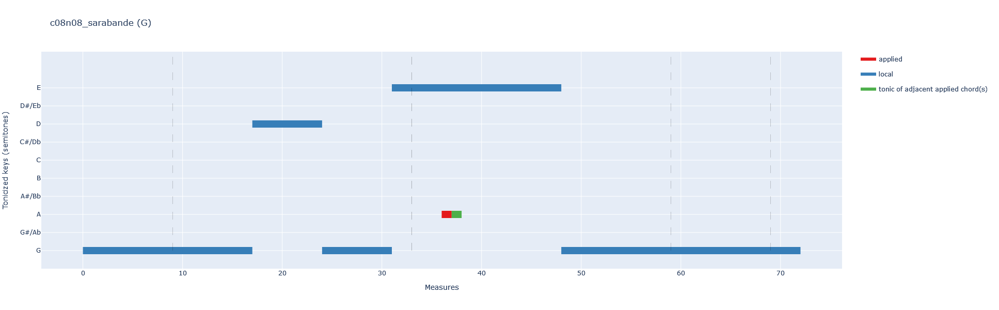

Creating modulation plan for c08n09_air_leger...


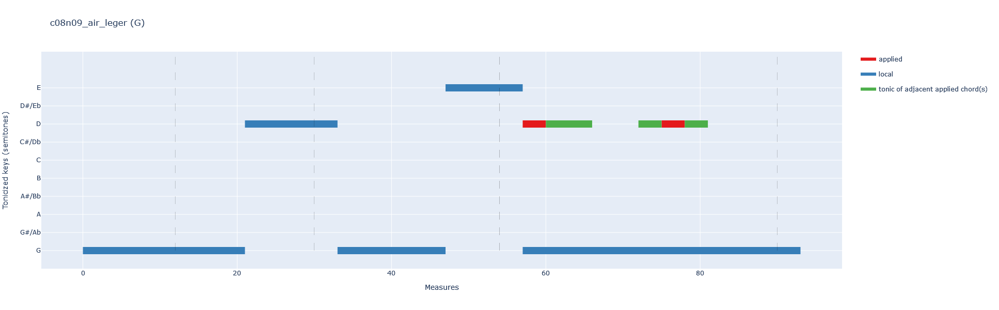

Creating modulation plan for c08n10_air_lentement...


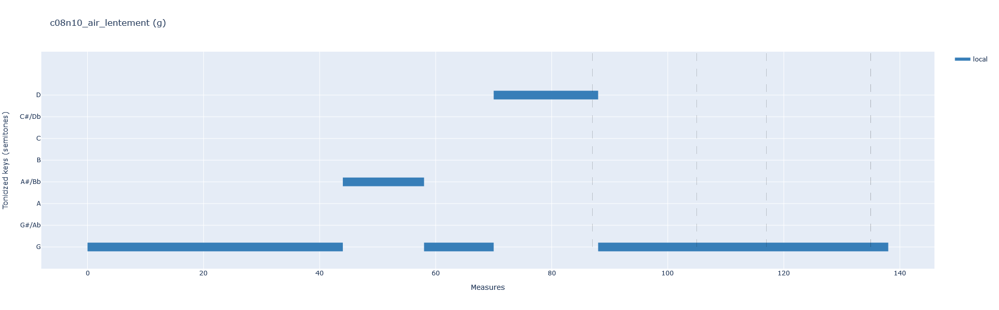

Creating modulation plan for c08n11_air_baccantes...


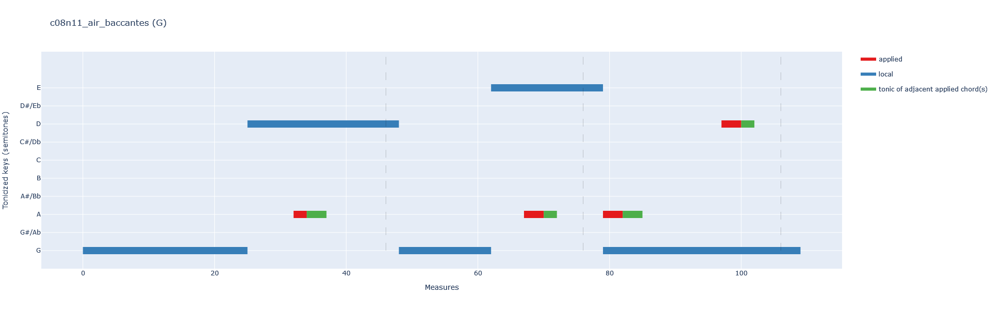

In [13]:
make_modulation_plans(corpus_obj, regex='c08')

## c09

Creating modulation plan for c09n01_charme...


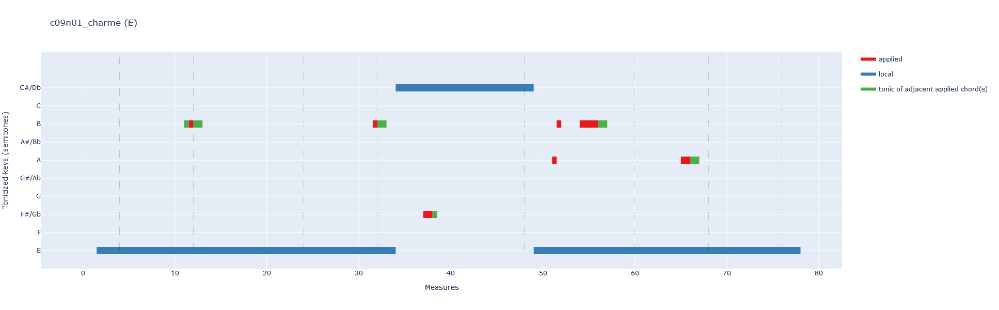

Creating modulation plan for c09n02_lenjouement...


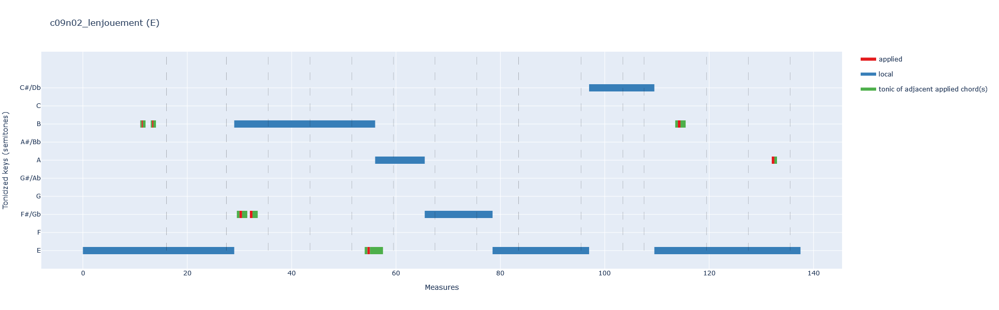

Creating modulation plan for c09n03_graces...


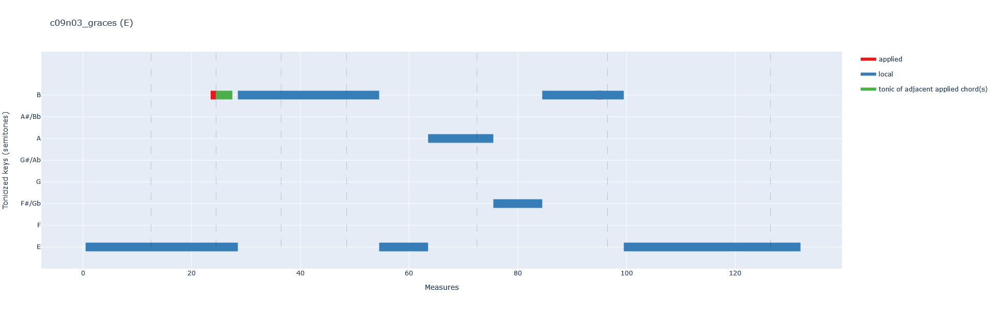

Creating modulation plan for c09n04_Lejene...


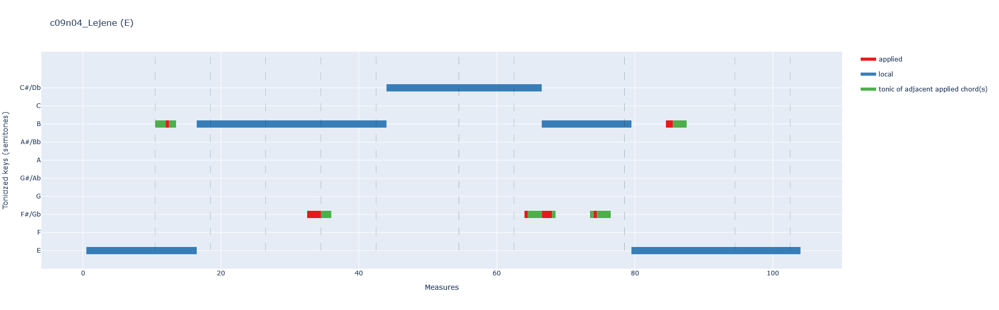

Creating modulation plan for c09n05_vivacite...


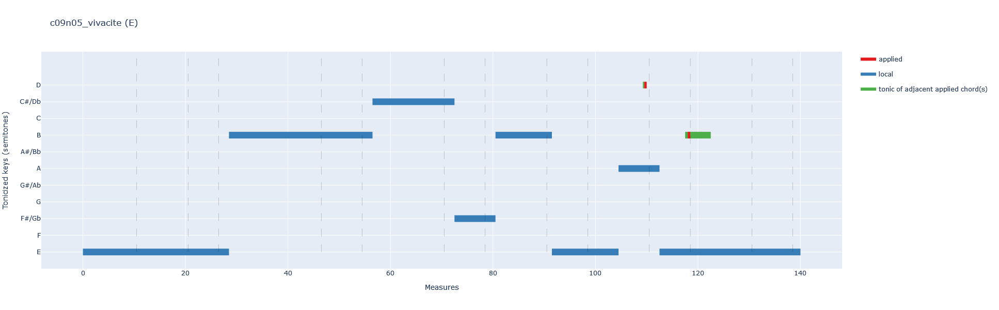

Creating modulation plan for c09n06_Sarabande...


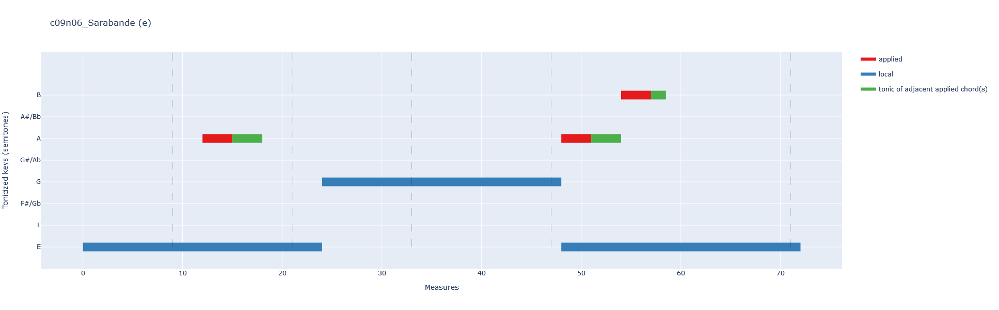

Creating modulation plan for c09n07_douceur...


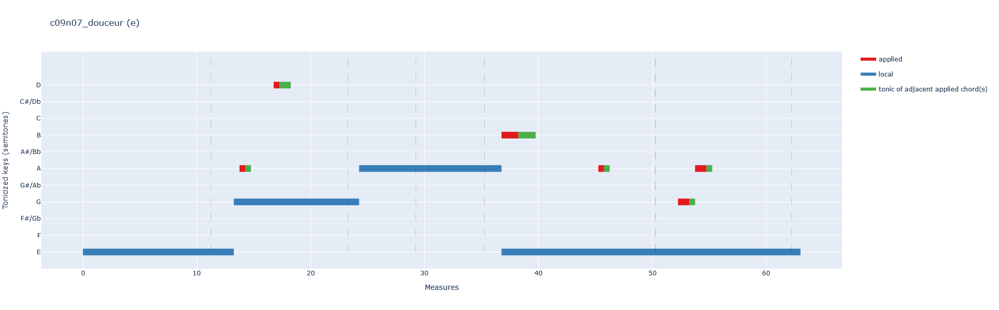

Creating modulation plan for c09n08_caetera...


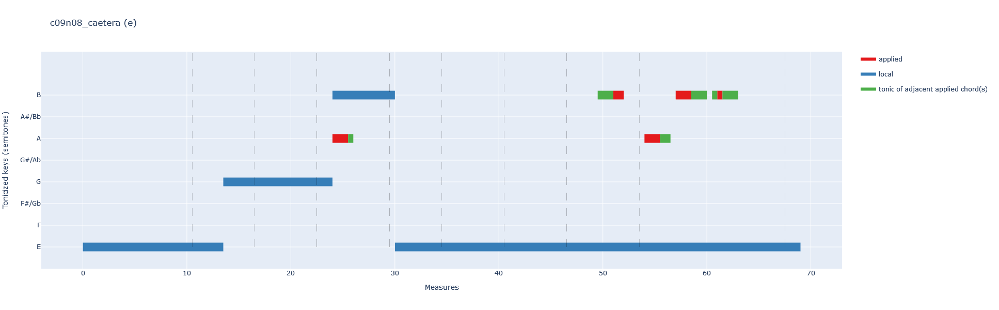

In [14]:
make_modulation_plans(corpus_obj, regex='c09')

## c10

Creating modulation plan for c10n01_gravement...


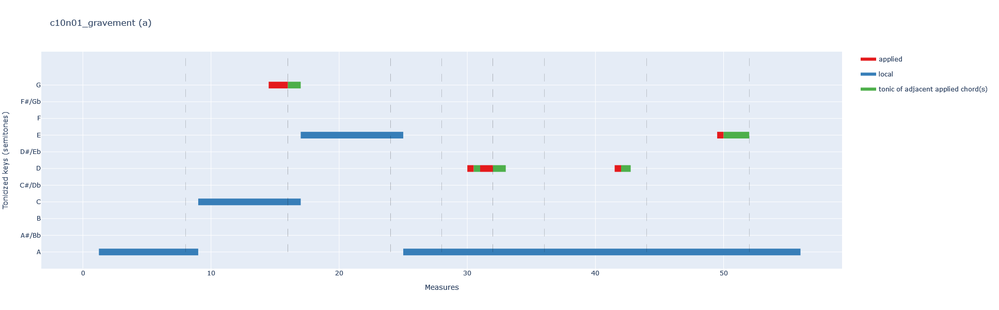

Creating modulation plan for c10n02_air...


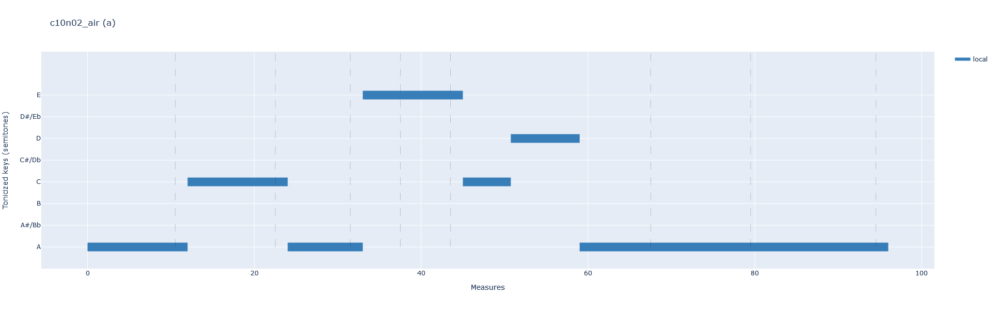

Creating modulation plan for c10n03_plainte...


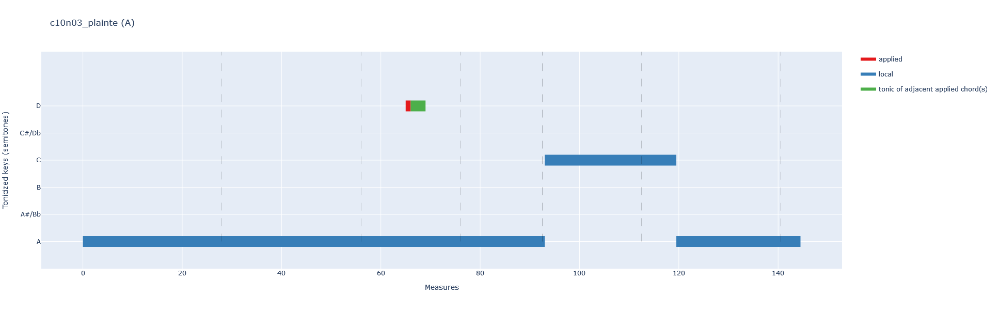

Creating modulation plan for c10n04_tromba...


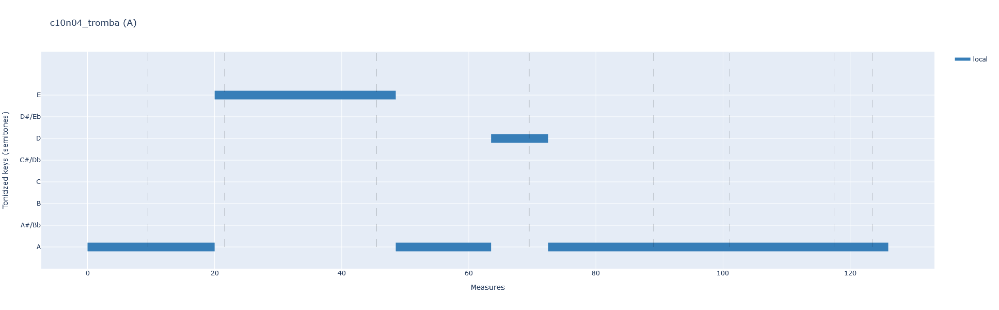

In [15]:
make_modulation_plans(corpus_obj, regex='c10')

## c11

Creating modulation plan for c11n01_majestueusement...


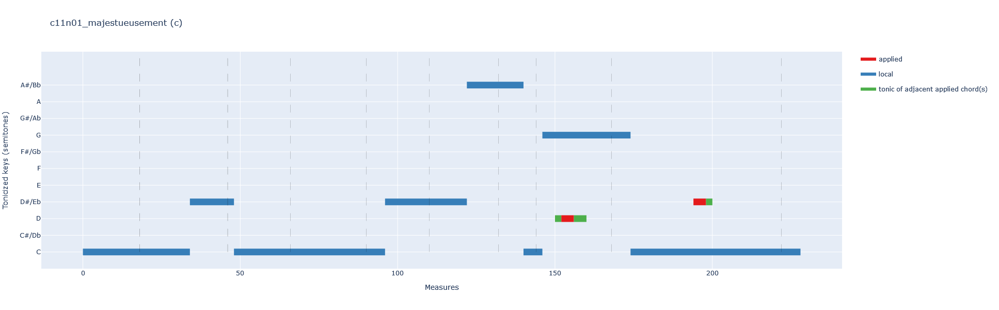

Creating modulation plan for c11n02_allemande...


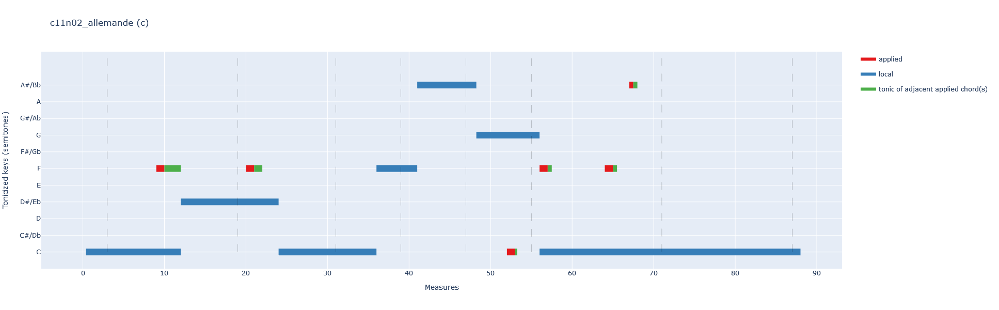

Creating modulation plan for c11n03_seconde_allemande...


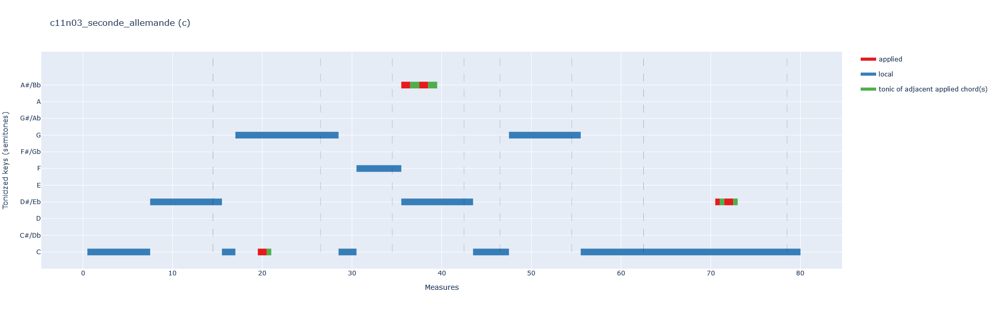

Creating modulation plan for c11n04_courante...


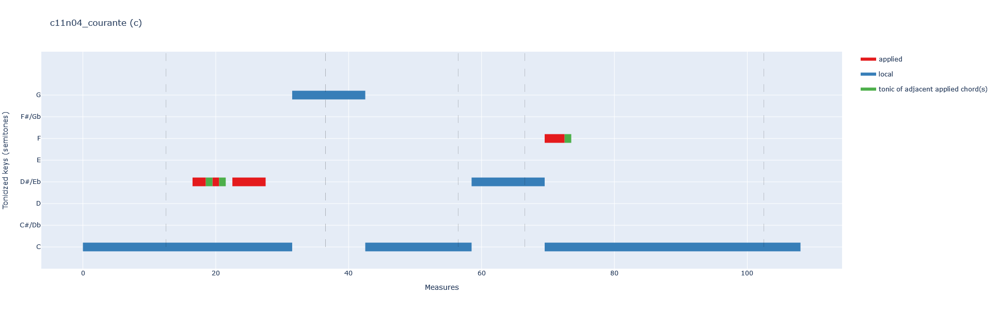

Creating modulation plan for c11n05_seconde_courante...


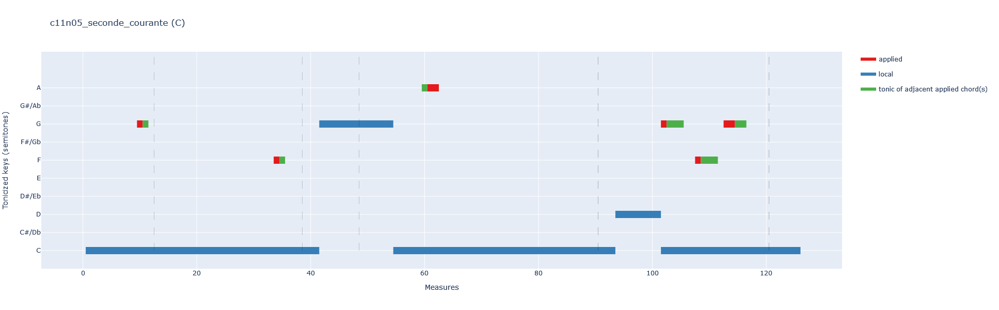

Creating modulation plan for c11n06_sarabande...


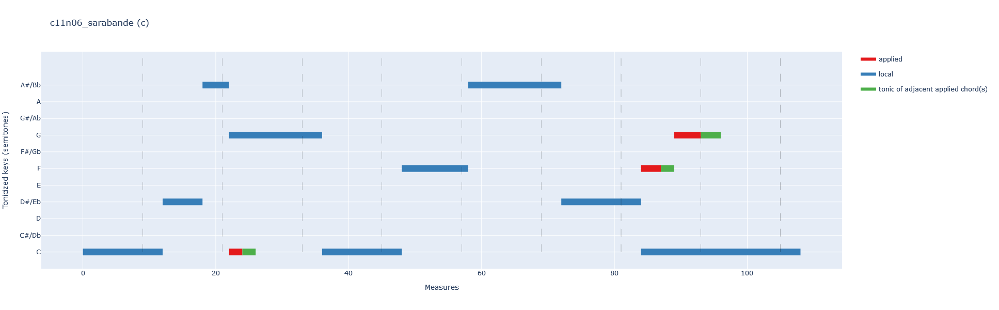

Creating modulation plan for c11n07_gigue...


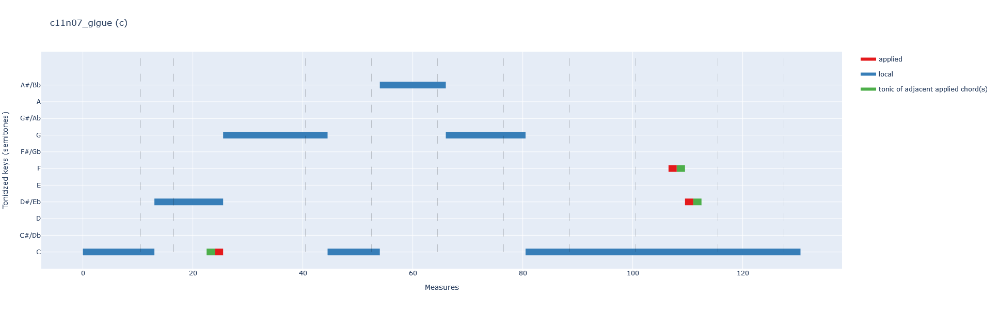

Creating modulation plan for c11n08_Rondeau...


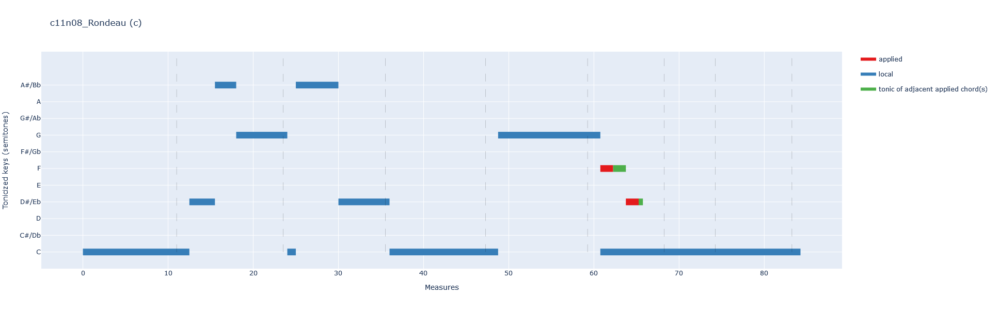

In [16]:
make_modulation_plans(corpus_obj, regex='c11')

## c14

Creating modulation plan for c14n01_gravement...


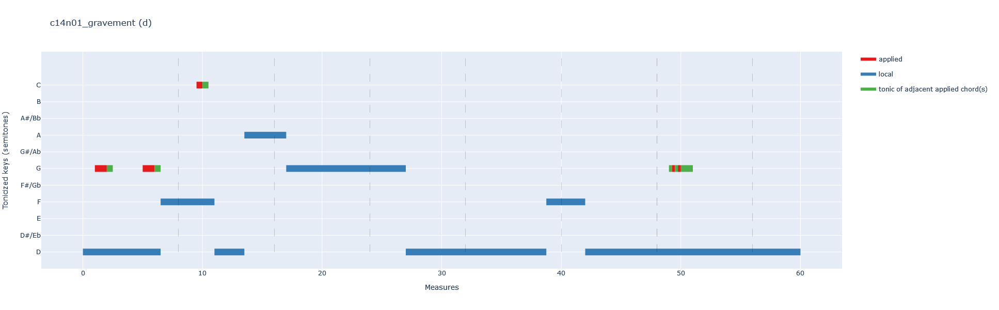

Creating modulation plan for c14n02_allemande...


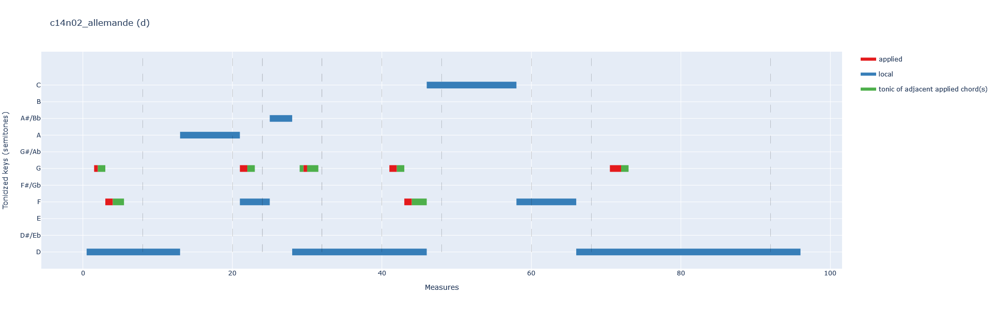

Creating modulation plan for c14n03_sarabande...


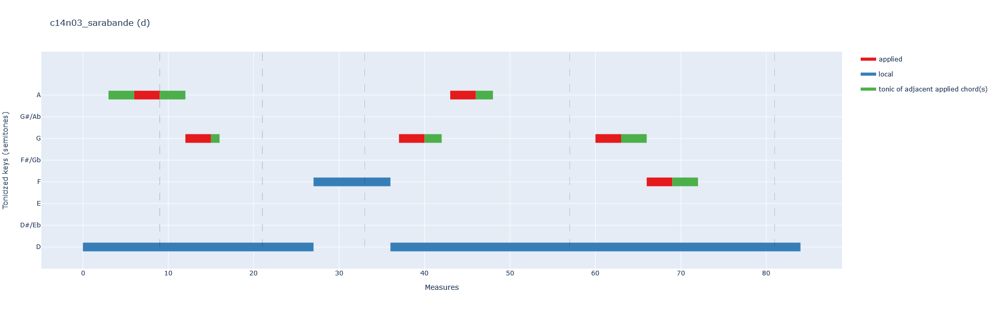

Creating modulation plan for c14n04_fuguete...


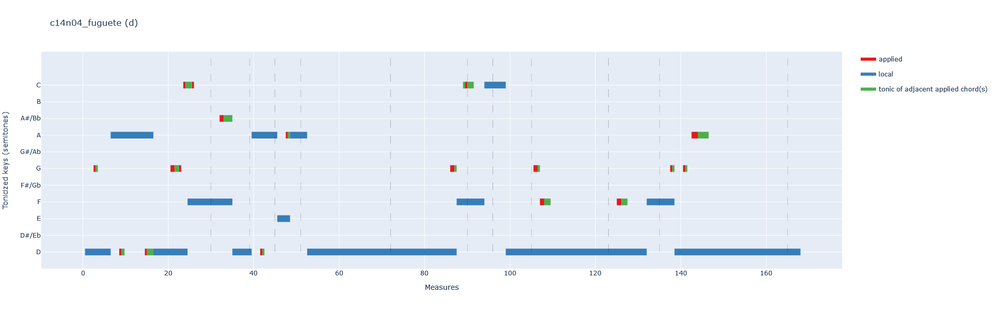

In [19]:
make_modulation_plans(corpus_obj, regex='c14')

## parnasse

Creating modulation plan for parnasse_01...


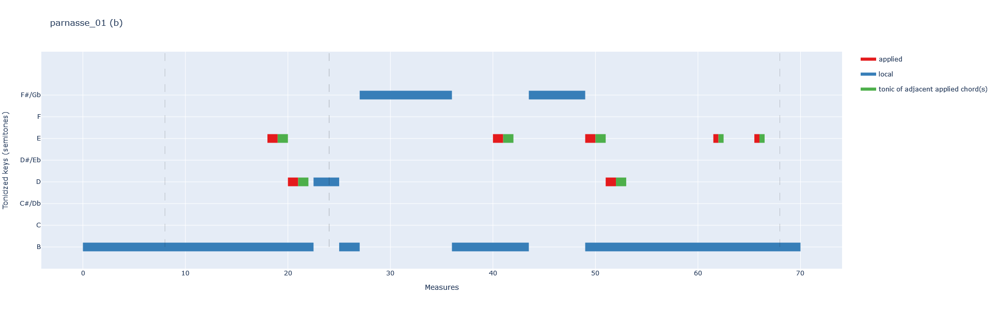

Creating modulation plan for parnasse_02...


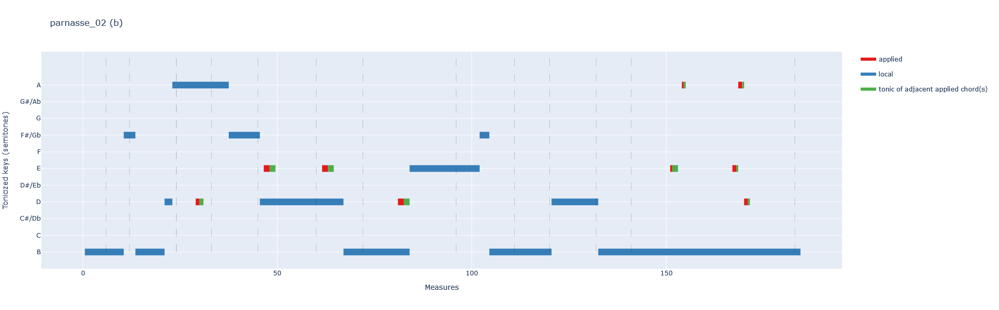

Creating modulation plan for parnasse_03...


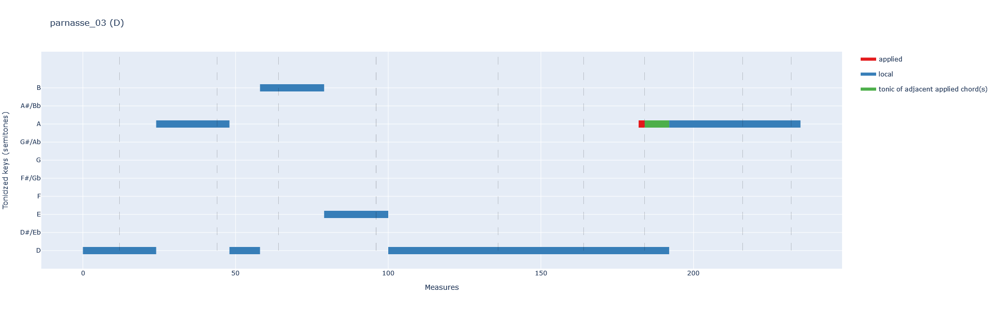

Creating modulation plan for parnasse_04...


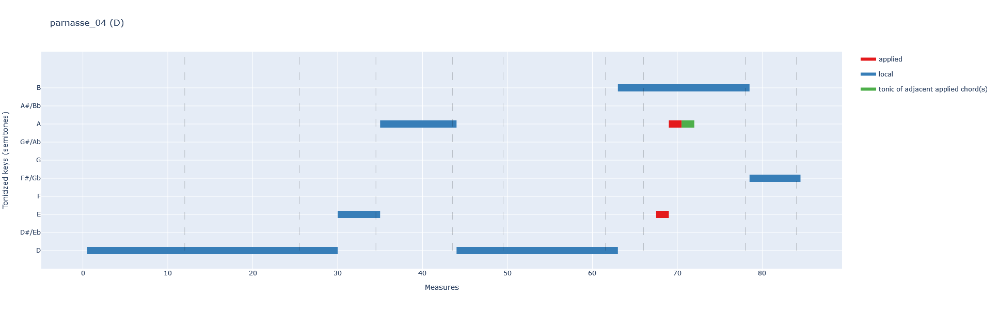

Creating modulation plan for parnasse_05...


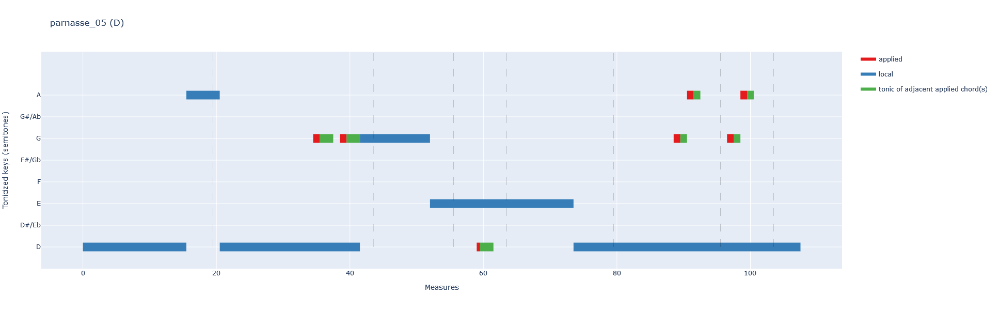

Creating modulation plan for parnasse_06...


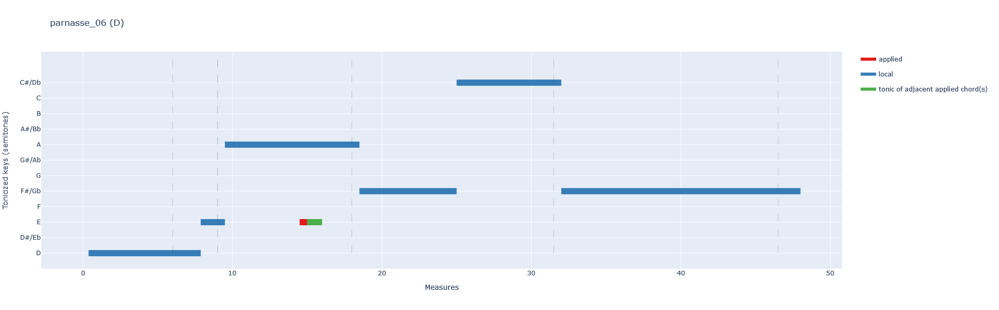

Creating modulation plan for parnasse_07...


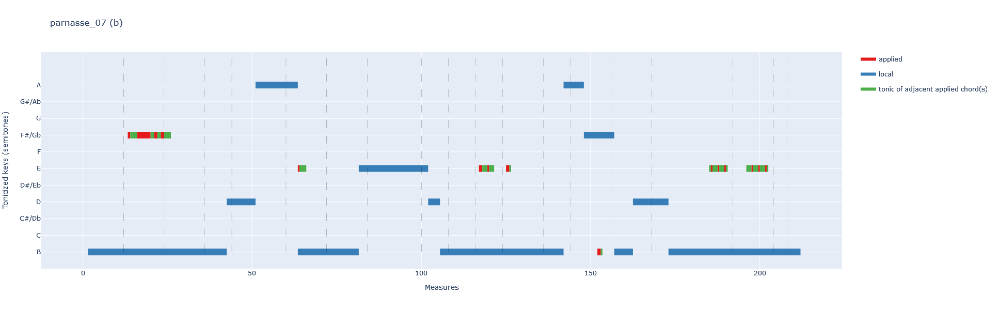

In [20]:
make_modulation_plans(corpus_obj, regex='parnasse')